# Рынок заведений общественного питания Москвы

Мне предстоит подготовить исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты.

Цель проекта -  получить результаты, которые в будущем помогут в выборе подходящего инвесторам места для размещения заведения общественного питания.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. В моем распоряжении файл с данными о покупках /datasets/moscow_places.csv 

Таким образом, исследование пройдет в 5 основных этапов:
- Шаг 1. Загрузим данные и изучим общую информацию
- Шаг 2. Выполним предобработку данных
- Шаг 3. Анализ данных
- Шаг 4. Детализируем исследование: открытие кофейни
- Шаг 5. Подготовка презентации

## Загрузим данные и изучим общую информацию

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
from scipy import stats
from numpy import median

In [2]:
try:
   data = pd.read_csv('/Users/osipovamichilina/Documents/moscow_places.csv')

except:
   data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


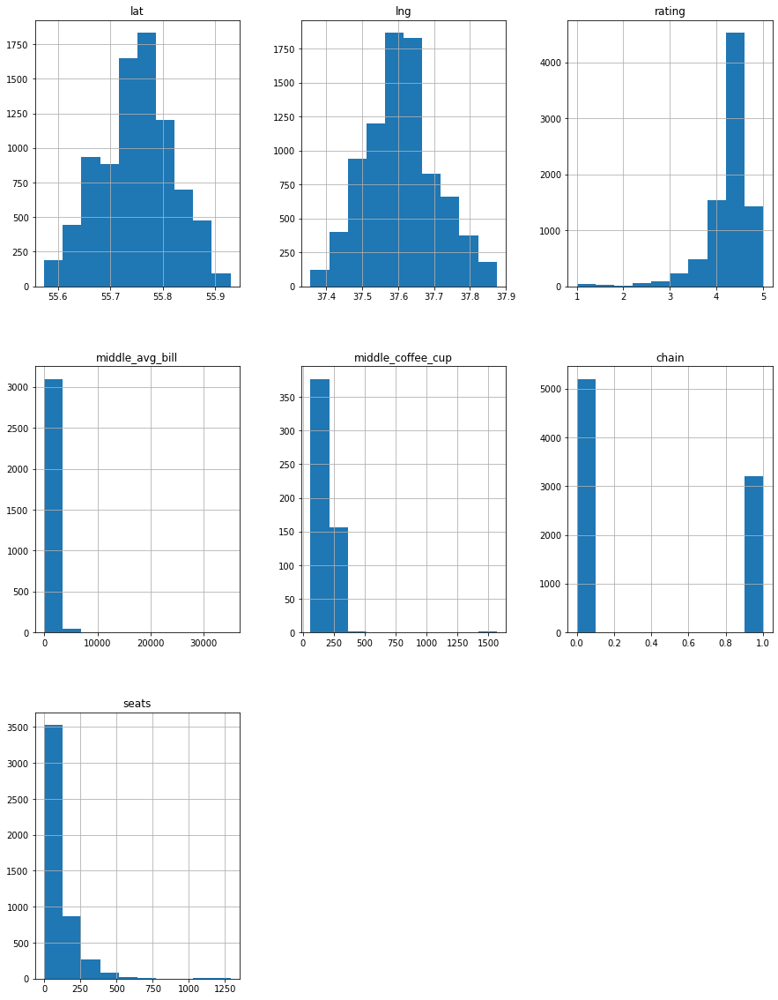

In [4]:
data.hist(figsize=(15, 20))
plt.show()

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
# определим количество уникальных мест
len(data['name'].unique())

5614

In [7]:
data['name'] = data['name'].str.replace('ё', 'е', regex=True)

In [8]:
len(data['name'].unique())

5608

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Вывод

- Датасет содержит информацию о местах общественного питания г. Москва. Представлено 5608 заведений. 
- Всего мы имеем 14 столбцов, достаточно подробная информация о каждом заведении. Используя метод info по признаку значений в столбцах можно понять что пропуски имеются в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.
- Считаю, что рационально и корректно заполнить эти данные на базе значений в прочих столбцах не представляется возможным, потому как есть задания как связанные с ценой и чеком, так и совсем не связанные.
- У нас следующие типы данных: float64(6), int64(1), object(7). 

## Предобработка данных

### Работа с пропусками, заполнение данных, проверка аномальных значений

In [10]:
# сделаем проверку на пропуски
data.isna().sum().sort_values()/data.shape[0]*100

name                  0.000000
category              0.000000
address               0.000000
district              0.000000
lat                   0.000000
lng                   0.000000
rating                0.000000
chain                 0.000000
hours                 6.376398
seats                42.957411
avg_bill             54.603854
price                60.563883
middle_avg_bill      62.538663
middle_coffee_cup    93.635498
dtype: float64

In [11]:
# перед проверкой на дубликаты, переведем значения столбца name  у нижнему регистру 
data['name'] = data ['name'].str.lower()

In [12]:
# проверим на наличие дубликатов
data.duplicated().sum()

0

In [13]:
# проверим неявные дубликаты чере сравнение столцбов
data[data[['name','address']].duplicated(keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [14]:
#удалим неяывные дубликаты
data.drop_duplicates(subset = ['name','address'], keep = 'first');

### Вывод по пропускам

<br>Просмотрев информацию о пропущенных значениях, считаю, что рационально и корректно заполнить эти данные на базе значений в прочих столбцах не представляется возможным потому как там есть задания как связанные с ценой, так и совсем не связанные.:
- `seats` - заполнить эти пропуски невозможно, т.к. количество мест может быть абсолютно любым;
- `hours` - заполнить эти пропуски невозможно, т.к. количество часов работы может быть абсолютно любым, поэтому данные оставим как есть;
- `avg_bill` - строка, которая хранит среднюю стоимость заказа в виде диапазона, заполнить эти пропуски невозможно без ручной обработки, поэтому оставим эти данные; 
- `price ` - заполнить нецелесообразно теоретически возможно заполнить данные пропуски медианами или средним арифметическим, но это будет крайне некорректным, т.к. количество мест в заведениях может быть разным, оставим эти данные без изменений;
- `middle_avg_bill` - число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, оставим эти данные; 
- `middle_coffee_cup` - аналогично столбцу `middle_avg_bill` - невозможно, оставим данные как есть.

В целом по датасету удаление 10% данных и менее - считается приемлемым уровнем при работе с очисткой данных. 

In [15]:
data[['seats', 'middle_coffee_cup']].describe()

,seats,middle_coffee_cup
count,4795.000000,535.000000
mean,108.421689,174.721495
std,122.833396,88.951103
min,0.000000,60.000000
25%,40.000000,124.500000
50%,75.000000,169.000000
75%,140.000000,225.000000
max,1288.000000,1568.000000


<br> Кроме того, в части максимальных значений по столбцам seats, middle_coffee_cup считаю нет необходимости их удалять, так как заказчики ещё не знают, что это будет за место: 
    кафе, ресторан, пиццерия, паб или бар, или фудкорт (как ДЕПО на Лесной))) — и какими будут расположение, меню и цены, и какой у них лимит по капексу мы тоже не знаем. Таким образом, аномалии лучше оставить без изменений.

In [16]:
fig = px.box(data, y="seats")
fig.show()

Выбросов много, верхняя граница ориентируется на значение 300 мест. И так как выбросов по столбцу много, то лучше их оставить.

In [17]:
seatsss = data.loc[data['seats'] ==920]
seatsss

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4180,eataly,"бар,паб","Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 12:00–23:00",55.743405,37.562535,4.6,NaN,NaN,NaN,NaN,0,920.0
4245,стейк & бургер,кафе,"Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 09:00–21:00",55.742953,37.561872,4.2,NaN,NaN,NaN,NaN,1,920.0


In [18]:
fig = px.box(data, y="middle_coffee_cup")
fig.show()

По столбцу middle_coffee_cup один выброс со значением 1568 рублей, верхняя граница на уровне 375 рублей. Выброс один, и мы его уберем при расчете средней стоимости чашки капучино.

### Создание новых столбцов по условию

In [19]:
# создадим столбец с названием улицы
data['street'] = data.address.apply(lambda x: x.split(', ')[1])

In [20]:
# создадим столбец с режимом работы
data['is_24/7'] = data.hours.apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)
data['is_24/7']

0       False
1       False
2       False
3       False
4       False
        ...  
8401    False
8402    False
8403     True
8404     True
8405     True
Name: is_24/7, Length: 8406, dtype: bool

In [21]:
data.hours.value_counts()

ежедневно, 10:00–22:00                                               759
ежедневно, круглосуточно                                             730
ежедневно, 11:00–23:00                                               396
ежедневно, 10:00–23:00                                               310
ежедневно, 12:00–00:00                                               254
                                                                    ... 
пн-чт 12:00–00:00; пт 12:00–03:00; сб 15:00–03:00; вс 15:00–00:00      1
пн-пт 11:00–23:00; сб,вс 12:00–03:00                                   1
пн-чт 07:30–22:00; пт 07:30–23:00; сб,вс 07:30–22:00                   1
пн-пт 13:00–15:30                                                      1
вт-вс 09:00–21:00                                                      1
Name: hours, Length: 1307, dtype: int64

In [22]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


## Анализ данных

### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [23]:
category = data.groupby('category',as_index=False).agg({'name': 'count'}).sort_values(by='name',ascending=False)
category['percent'] = round(category['name'] * 100/ category['name'].sum(),0)
category

,category,name,percent
3,кафе,2378,28.0
6,ресторан,2043,24.0
4,кофейня,1413,17.0
0,"бар,паб",765,9.0
5,пиццерия,633,8.0
2,быстрое питание,603,7.0
7,столовая,315,4.0
1,булочная,256,3.0


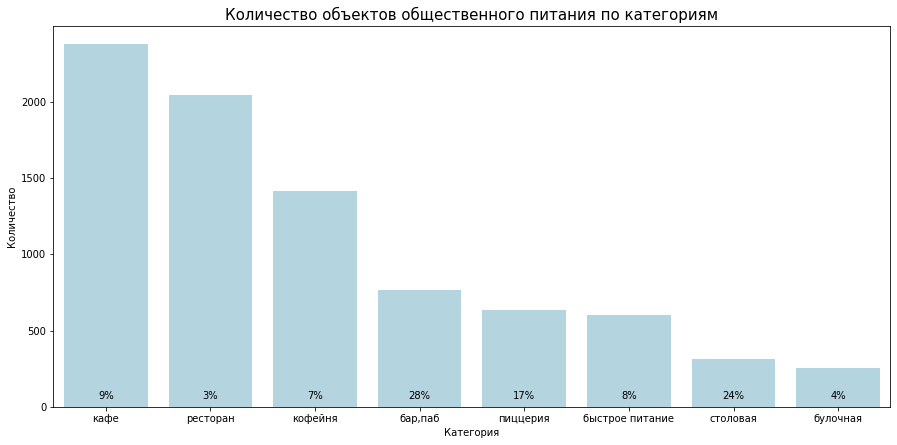

In [24]:
plt.figure(figsize=(15,7))
plt.title('Количество объектов общественного питания по категориям', fontdict={'size':15})
ax = sns.barplot (data=category, x='category', y='name', color='lightblue')
z=category['percent']

for i in range(len(z)):
    ax.text (i,40,f'{int(z[i])}%', ha='center', va= 'bottom')
ax.set(xlabel='Категория', ylabel='Количество');

Представлено 8 категорий заведений, количество распределено следующим образом: кафе, рестораны - наибольшее количество порядка 2000; около 1500 - кофеен; почти равное количество по категориям 600-700  пиццерия, бар/паб, быстрое питание; после следуют с количеством 300-250 категории столовая и булочная.

### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [25]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

In [26]:
median_seats = data[data['seats']!=0].groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending= False)
median_seats

,category,seats
6,ресторан,90.0
0,"бар,паб",84.0
4,кофейня,80.0
7,столовая,80.0
2,быстрое питание,75.0
3,кафе,60.0
5,пиццерия,56.0
1,булочная,52.0


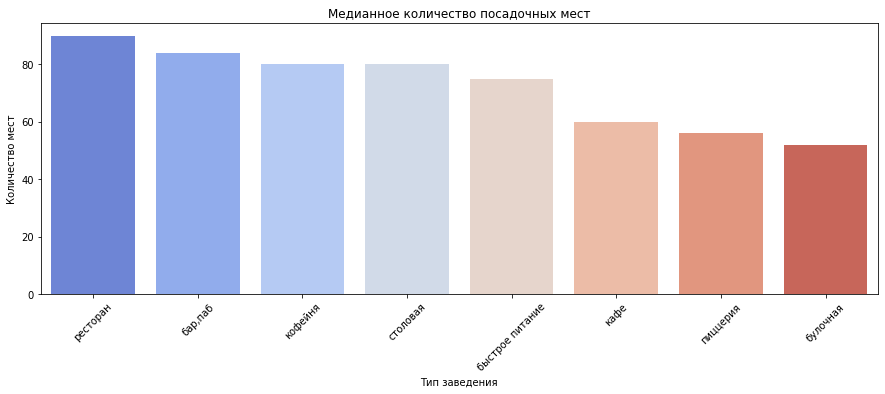

In [27]:
plt.figure(figsize=(15, 5))
sns.barplot(x='category', y='seats', data=median_seats, palette = 'coolwarm')
plt.title('Медианное количество посадочных мест')
plt.xlabel('Тип заведения')
plt.ylabel('Количество мест')
plt.xticks(rotation=45)
plt.show()

- Больше всего посадочных мест в ресторанах, бар/паб - люди проводят больше времени и приходят в основном в вечернее время, поэтому рестораны имеют больше посадочных мест, так же в них часто проводят мероприятия различного характера(корпоративы, банкеты и тд). Чаще всего данные заведения расположены на 1 этажах и полностью занимают 1 этажи зданий.

- Далее идут кофейни по количеству посадочных мест. Большое количество посадочных мест и количество кофеен объясняется востребованностью мест для завтраков, деловых встреч. Кроме того, наш датасет составлен на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года, то это еще места для удаленной работы специалистов.

- Следом заведения быстрого питания, которые располагаются в ТЦ на последних этажах, количество меньше, так как часть заказов берется на вынос. Столовые расположены в основном под конкретные организации, и ориентированы на количество сотрудников организации, судя по всему они расположены не в центральной части города.

- Для кафе характено большое кол-во объектов и маленькое кол-во посадочных мест,после идут булочные и пиццерии, которые являются в наибольшей степени сетевыми и располагаются в жилых домах и люди чаще берут заказ на вынос.

### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [28]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [29]:
data['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

По условиям:
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

In [30]:
fig = go.Figure(data=[go.Pie(labels=data['chain'].value_counts().index, values=data['chain'].value_counts(), \
                             title='Соотношение сетевых и несетевых заведений по количеству')])
fig.show()

Больше несетевых заведений их почти 61%, и 39% сетевых заведений.

### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [31]:
restaurant_chain = data.query('chain==1').groupby('category', as_index=False).agg({'name': 'count'}).sort_values(by='name',ascending=False)
restaurant_chain ['percent'] = round(restaurant_chain['name'] / category['name'],3)
restaurant_chain.sort_values(by='percent',ascending=False)

,category,name,percent
1,булочная,157,0.613
5,пиццерия,330,0.521
4,кофейня,720,0.510
2,быстрое питание,232,0.385
6,ресторан,730,0.357
3,кафе,779,0.328
7,столовая,88,0.279
0,"бар,паб",169,0.221


In [32]:
fig = px.bar(restaurant_chain,
             x='category', y='percent',
             title='Количество объектов питания',
             text=(round(restaurant_chain['percent']*100, 3)))
fig.update_layout (title='% сетевых от общего количества заведений каждого типа',
                   xaxis_title="Тип объекта",
                   yaxis_title="Доля",
                   xaxis=dict(
                       tickmode='array', 
                       tickvals=restaurant_chain['category'], 
                       ticktext=restaurant_chain['category']
                   ),
                   autosize=False, 
                   width=1200, height=500
                  )
fig.show()

Сетевое распространение характерно в основном для булочных, пиццерий, кафе.

### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [33]:
# Собираем отдельно топ-15 заведений и их категории: 
chain_top_15 = data[data['chain'] == 1]
chain_top_15 = chain_top_15.groupby(['name', 'category']).agg({'name' : 'count'})
chain_top_15.columns = ['count']
chain_top_15 = chain_top_15.sort_values('count', ascending = False).reset_index().head(15)
chain_top_15.head(15)

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


In [34]:
# Визуализируем 15 самых популярных сетей. Для этого построим столбчатую диаграмму: 
fig = px.bar(chain_top_15, x='name', y='count', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout (title= 'Топ-15 сетевых заведений',
                   xaxis_title='Название сети',
                   yaxis_title= 'Количество заведений',
                   autosize =False, 
                   width=900, 
                   height=550,
                   xaxis={'categoryorder': 'total descending' })
fig.show()

Под популярностью понимается количество заведений этой сети в регионе, самое популярное заведение с большим отрывом это "Шоколадница", распространенность связана с размещением заведения в ТЦ, на вокзалах, аэропортах и вблизь станций метро. Далее идут сетевые пиццерии, кофе-точки, яндекс лавка - связано с размещением в ЖК и вблизь станций метро. 

In [35]:
top_grouped_category = (chain_top_15.groupby('category',as_index=False)
                         .agg(count_object=('name', 'count')) 
                         .sort_values (by='count_object', ascending=False))
top_grouped_category['ratio'] = top_grouped_category['count_object'] / top_grouped_category['count_object'].sum()*100
top_grouped_category

,category,count_object,ratio
2,кофейня,6,40.000000
1,кафе,3,20.000000
4,ресторан,3,20.000000
3,пиццерия,2,13.333333
0,булочная,1,6.666667


In [36]:
category_top15 = ['кофейня', 'кафе', 'ресторан', 'пиццерия', 'булочная']
ratio_top15 = [40, 20, 20, 13.3, 6.7]

fig = go.Figure(data=[go.Pie(labels=category_top15, values=ratio_top15)])
fig.show() 

### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [37]:
# отобразим количество заведений каждой категории по районам 
district_category = data.pivot_table(index = 'district',
                                   columns = 'category',
                                   values = 'name',
                                   aggfunc = 'count').reset_index()
 
# отобразим общее количество заведений по районам 
shop_total = data.groupby('district')['chain'].count()

 
# объединим таблицы с количеством заведений каждой категории и общим количеством заведений
total_district_category = district_category.merge(shop_total, on='district')
total_district_category.columns = ['Район Москвы', 'бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан','столовая','Общее количество заведений']

total_district_category = total_district_category.sort_values('Общее количество заведений', ascending = False).reset_index().head(15)
total_district_category

,index,Район Москвы,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,Общее количество заведений
0,5,Центральный административный округ,364,50,87,464,428,113,670,66,2242
1,2,Северный административный округ,68,39,58,235,193,77,189,41,900
2,8,Южный административный округ,68,25,85,264,131,73,202,44,892
3,3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
4,1,Западный административный округ,50,37,62,239,150,71,218,24,851
5,0,Восточный административный округ,53,25,71,272,105,72,160,40,798
6,6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
7,7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
8,4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


In [38]:
# строим график
name_c = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан','столовая']
name_d = ['Восточный административный округ', 'Западный административный округ', 'Северный административный округ', 'Северо-Восточный административный округ', 'Северо-Западный административный округ', 'Центральный административный округ', 'Юго-Восточный административный округ', 'Юго-Западный административный округ', 'Южный административный округ']
 
fig = px.bar(total_district_category, x=name_d, y=name_c, text='value', width=1000, height=900,title="Распределение категории заведений по районам Москвы")
 
fig.show()

Лидером размещения с двойным отрывом является ЦАО, в котором расположено практически 50% всех ресторанов города. Практически с одинаковым количеством заведений далее следуют САО, СВАО, ЗАО, ЮАО, ВАО. На третьем месте ЮВАО, ЮЗАО. Меньше всего заведений в СЗАО.

### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [39]:
mean_rating = data[data['rating']!=0].groupby('category')['rating'].mean().reset_index().sort_values(by='rating', ascending= False)
mean_rating

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


plt.figure(figsize=(7,7))
plt.title('Распределение средних рейтингов по категориям заведений', fontdict={'size':10})
ax = sns.barplot (data=mean_rating, x='category', y='rating', color='lightblue')
plt.xticks(rotation=45)
ax.set(xlabel='Название категории заведения', ylabel='Средний рейтинг заведений');

В среднем рейтинг по категориям колеблется от 4 до 4.4. Высоко оцененные заведения это бары, рестораны. Низкий рейтинг у ресторанов быстрого питания и кафе. 

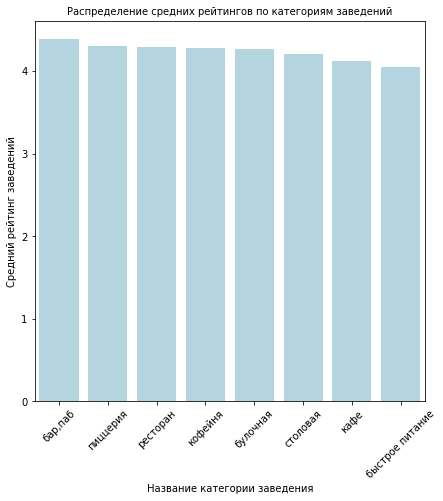

In [40]:
plt.figure(figsize=(7,7))
plt.title('Распределение средних рейтингов по категориям заведений', fontdict={'size':10})
ax = sns.barplot (data=mean_rating, x='category', y='rating', color='lightblue')
plt.xticks(rotation=45)
ax.set(xlabel='Название категории заведения', ylabel='Средний рейтинг заведений');

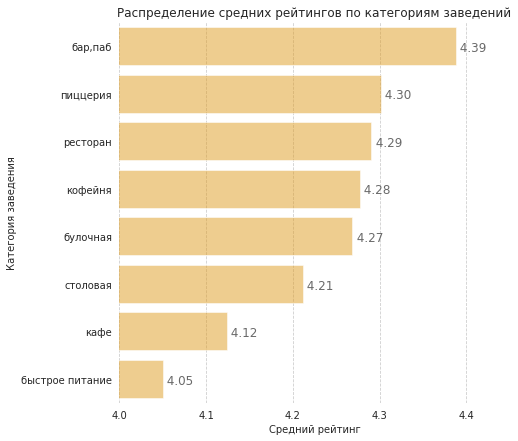

In [41]:
# Пример к комментарию ревьюера

sns.set_style("whitegrid", {'grid.linestyle': '--'})
fig, ax = plt.subplots(figsize=(7, 7))
ax = sns.barplot(data=mean_rating, y='category', x='rating', color='orange', alpha=0.5)
ax.set(xlim=(4, 4.45), ylabel='Категория заведения', xlabel='Средний рейтинг')
ax.set_title('Распределение средних рейтингов по категориям заведений')

# подписи к столбчатой диаграмме
for patch in ax.patches:
    ax.text(
        patch.get_width() + 0.0005, 
        patch.get_y() + 0.5,
        " {:,.2f}".format(patch.get_width()), 
        fontsize=12,
        color='dimgrey'
    )
   
sns.despine(left=True, bottom=True);

### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [42]:
avg_rating = data.groupby('district', as_index=False)['rating'].agg('mean')
avg_rating
# Посмотрим средний рейтинг заведений каждого района

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [43]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [44]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=avg_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Сосредоточение заведений с самым высоким средним рейтингом  в ЦАО, на втором месте САО, затем СЗАО. В ЮВАО заведения с самым низким рейтингом .

### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [45]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [46]:
# выведем сборную таблицу с топ-15 улиц по количеству заведений и категориями заведений
# добавляем столбец с суммарным количеством заведений на улице и сортируем улицы по убыванию количества заведений
top_streets = data [data['street'].isin(
    data.groupby ('street') ['name'].count ( )
    .sort_values (ascending=False).head(15).index)]

streets_and_cat = top_streets.groupby(['street','category'], as_index=False)['name'].count()
streets_and_cat.rename ({'name':'count'}, axis=1, inplace=True)
streets_and_cat

,street,category,count
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


In [47]:
fig = px.bar(streets_and_cat, x='street', y='count', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout (title= 'Распределение количества заведений и их категорий по топ-15 улицам',
                   xaxis_title='Улица',
                   yaxis_title= 'Количество заведений',
                   autosize =False, 
                   width=900, 
                   height=550,
                   xaxis={'categoryorder': 'total descending' })
fig.show()

- В целом этот список топ-15 улиц имеет список из очень больших по площади улиц/проспектов/шоссе и распределение идет равномерно с населением в этих районах, а так же кол-вом бизнес-центров, прогулочных площадей и тд. 
- Больше всего заведений - это проспект Мира. Преимущественно на проспекте мира располагаются кафе(более 50, рестораны(более 40), кофейни (около 30). По количеству кафе следующим идет МКАД, это объясняется протяженностью улицы. На улицах: проспект Вернандского, Лениснский проспект, Дмитровское шоссее, Ленинградское шоссе, Кутузовский проспект и Пятницкая больше всего ресторанов.

### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [48]:
data_street =  (data.groupby('street', as_index=False)
                              .agg(count_object=('name', 'count'))
                              .sort_values(by='count_object', ascending=False))

In [49]:
#с одним заведением
one_place_street_list = data_street.query('count_object == 1')['street'].unique()
print(f'Количество улиц с одним заведением = {len(one_place_street_list)}')
 
one_place_street_df = data[data['street'].isin(one_place_street_list )]
 

one_place_street_df

Количество улиц с одним заведением = 458


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False
8294,wtfcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
8317,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8379,лагман хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


In [50]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']} {row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
one_place_street_df.apply(create_clusters, axis=1)

# выводим карту
m

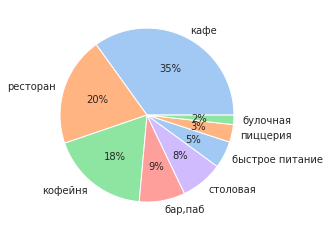

In [51]:
one_place_street_df['category'].value_counts()
#доля
one_place_street_df['category'].value_counts() / one_place_street_df['category'].count() * 100
 
#любой график
colors = sns.color_palette('pastel')[:5]
 
plt.pie(x=one_place_street_df['category'].value_counts().values,\
        labels=one_place_street_df['category'].value_counts().index, \
        colors=colors, \
        autopct='%.0f%%')
plt.show()

В предыдущем задании мы определяли улицы с наибольшим количеством заведений, как показал анализ это большие и протяженные улицы. 

- Всего 458 улиц с 1 заведением. С учетом карты больше всего таких улиц, а именно 153 в ЦАО, можно предположить, что в основном это проезды и переулки с маленькой протяженностью.  В целом такие улицы находятся по всему городу.

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [52]:
data_middle_avg_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
data_middle_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [53]:
places = data.loc[data['middle_avg_bill'] <= data['middle_avg_bill'].quantile(.95)]

In [54]:
places = places.dropna(subset=['middle_avg_bill'])
data_middle_avg_bill = places.groupby ('district', as_index = False)['middle_avg_bill'].agg('median')
data_middle_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,850.0
2,Северный административный округ,625.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,675.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,434.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [55]:
import folium
from folium import Map, Choropleth
 
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
 
m_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
 
Choropleth(
    geo_data=state_geo,
    data=data_middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Медианная стоимость заказа в рублях по районам',
).add_to(m_4)
 
folium.GeoJson(
    state_geo,
    name='district',
    style_function=lambda feature: {
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0,
    },
    tooltip=folium.features.GeoJsonTooltip(fields=['name'], aliases=['district']),
).add_to(m_4)
folium.LayerControl().add_to(m_4)
 
m_4

 ### Вывод по анализу
 
- Представлено 8 категорий заведений, больше всего заведений кафе и рестораны.
 
- Больше всего посадочных мест в ресторанах, бар/паб, далее идут кофейни по количеству посадочных мест. Следом заведения быстрого питания, для кафе характено большое кол-во объектов и маленькое кол-во посадочных мест,после идут булочные и пиццерии, которые являются в наибольшей степени сетевыми и располагаются в жилых домах и люди чаще берут заказ на вынос.
 
- Несетевых заведений порядка 60%, остальные 40 это сетевые заведения.

- Сетевое распространение характено в основном для булочных, пиццерий, кофеен.

- Топ 15 сетевых заведений. Самое популярное заведение с большим отрывом это "Шоколадница", далее идут сетевые пиццерии, кофе-точки, яндекс лавка - связано с размещением в ЖК и вблизь станций метро.
 
- В среднем рейтинг по категориям колеблется от 4 до 4.4. Высоко оцененные заведения это бары, рестораны. Низкий рейтинг у ресторанов быстрого питания и кафе. Сосредоточение заведений с самым высокцим средним рейтингом  в ЦАО, на втором месте САО, затем СЗАО. В ЮВАО заведения с самым низким рейтингом .
 
- Что касается улиц - больше всего заведений - это проспект Мира. Преимущественно на проспекте мира располагаются кафе(более 50, рестораны(более 40), кофейни (около 30). По количеству кафе следующим идет МКАД, это объясняется протяженностью улицы. На улицах: проспект Вернандского, Лениснский проспект, Дмитровское шоссее, Ленинградское шоссе, Кутузовский проспект и Пятницкая больше всего ресторанов.
 
- Всего 458 улиц с 1 заведением. С учетом карты больше всего таких улиц, а именно 153 в ЦАО, можно предположить, что в основном это проезды и переулки с маленькой протяженностью. В целом такие улицы находятся по всему городу.
 
- Самый высокий средний чек в заведениях, расположенных в центре и на западе Москвы. В среднем ценовой категории находятся ЮЗАО,СЗАО, САО, ВАО. Самый нижний средний чек это ЮВАО И СВАО.

## Детализируем исследование: открытие кофейни


### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?


In [56]:
coffee_house = data.loc[data['category'] =='кофейня']

print ('В Москве всего', len(coffee_house['name']),'кофеен')


В Москве всего 1413 кофеен


In [57]:
coffee_house.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False


In [58]:
coffee_houses = (coffee_house.groupby(['district','category'], as_index=False)
                         .agg(count_object=('name', 'count')) 
                         .sort_values (by='count_object', ascending=False))
coffee_houses['ratio'] = coffee_houses['count_object'] / coffee_houses['count_object'].sum()*100
coffee_houses

,district,category,count_object,ratio
5,Центральный административный округ,кофейня,428,30.290163
2,Северный административный округ,кофейня,193,13.658882
3,Северо-Восточный административный округ,кофейня,159,11.252654
1,Западный административный округ,кофейня,150,10.615711
8,Южный административный округ,кофейня,131,9.271054
0,Восточный административный округ,кофейня,105,7.430998
7,Юго-Западный административный округ,кофейня,96,6.794055
6,Юго-Восточный административный округ,кофейня,89,6.298655
4,Северо-Западный административный округ,кофейня,62,4.387827


### Есть ли круглосуточные кофейни?

In [59]:
cof_clock_rat = coffee_house.query('hours == "ежедневно, круглосуточно"')
cof_clock_rat
print ('В Москве круглосуточных кофеен', len(cof_clock_rat['name']),'всего')

В Москве круглосуточных кофеен 59 всего


### Какие у кофеен рейтинги? Как они распределяются по районам?

In [60]:
coffee_houses = (coffee_house.groupby(['district','category'], as_index=False)
                         .agg(count_object=('name', 'count'),mean=('rating', 'mean'),) 
                         .sort_values (by='mean', ascending=False))


coffee_houses
# Посмотрим средний рейтинг заведений каждого района

,district,category,count_object,mean
5,Центральный административный округ,кофейня,428,4.336449
4,Северо-Западный административный округ,кофейня,62,4.325806
2,Северный административный округ,кофейня,193,4.291710
7,Юго-Западный административный округ,кофейня,96,4.283333
0,Восточный административный округ,кофейня,105,4.282857
8,Южный административный округ,кофейня,131,4.232824
6,Юго-Восточный административный округ,кофейня,89,4.225843
3,Северо-Восточный административный округ,кофейня,159,4.216981
1,Западный административный округ,кофейня,150,4.195333


In [61]:
import folium
from folium import Map, Choropleth
 
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
 
m_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
 
Choropleth(
    geo_data=state_geo,
    data=coffee_houses,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m_4)
 
folium.GeoJson(
    state_geo,
    name='district',
    style_function=lambda feature: {
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0,
    },
    tooltip=folium.features.GeoJsonTooltip(fields=['name'], aliases=['district']),
).add_to(m_4)
folium.LayerControl().add_to(m_4)
 
m_4

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [62]:
data['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [63]:
data1 = data.dropna(subset=['middle_coffee_cup'])

In [64]:
data1 = data1[(data1['middle_coffee_cup'] != 1568.000000)]

In [65]:
data1['middle_coffee_cup'].describe()

count    534.000000
mean     172.112360
std       65.408333
min       60.000000
25%      124.250000
50%      168.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

In [66]:
coffee_house['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [67]:
coffee_house['middle_coffee_cup'].median()

170.0

In [68]:
coffee_cup = coffee_house.groupby ('district', as_index = False)['middle_coffee_cup'].agg('median')
coffee_cup.sort_values(by='middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


При открытии стоит ориентироваться на стоимость чашки кофе порядка от 135-198 рублей. Себестоимость чашки напитка, в которую входят затраты на сам кофе, стаканчик и различные топинги, может быть увеличена для конечного покупателя на 500%. Кроме того, если это все-таки кофейня то кофе закажут практически каждый клиент.